In [114]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import cv2
import os
import glob

#reading files
import rasterio
import rioxarray
import xarray as xr
from PIL import Image

In [115]:
#reading the images
img_path = glob.glob("/home/akansh-i2sc/Desktop/Research@Societal/detect-car-LR/data/AlAinRoad-Dubai/*/*/*.tif")
print(len(img_path))

221


In [116]:
img = rioxarray.open_rasterio(img_path[0])

for i in img_path:
    img = rioxarray.open_rasterio(i)
    assert img.shape == (4, 164, 222)
print(f"shape is correct{img.shape}")

shape is correct(4, 164, 222)


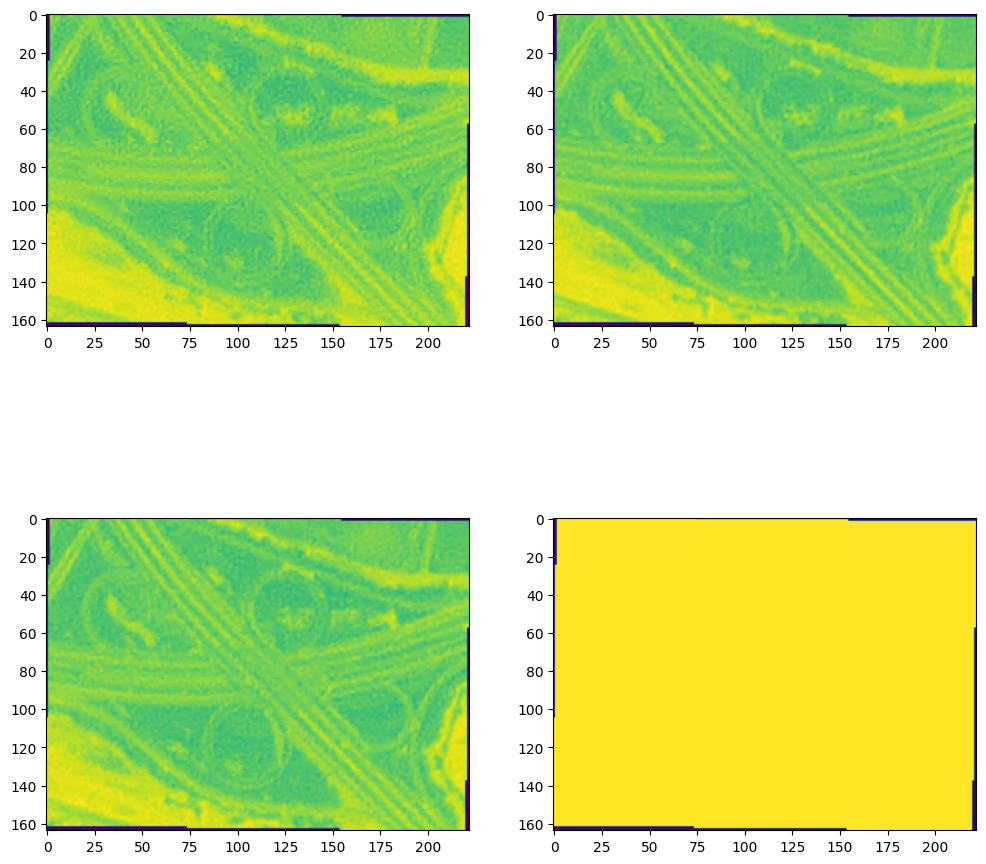

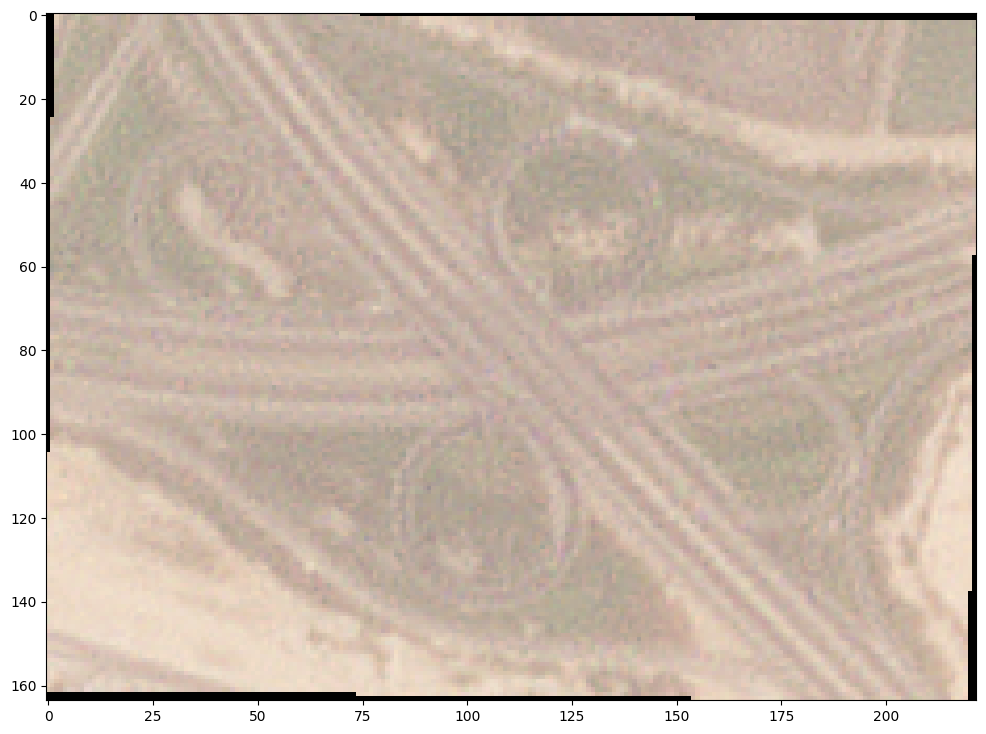

In [117]:
#plot all bands of the image
plt.figure(figsize=(12, 12))
plt.subplot(221)
plt.imshow(img.data[0]) 
plt.subplot(222)    
plt.imshow(img.data[1])
plt.subplot(223)
plt.imshow(img.data[2])
plt.subplot(224)
plt.imshow(img.data[3])

#plotting the first three bands of the image
plt.figure(figsize=(12, 12))
plt.imshow(img.data[0:3].transpose(1, 2, 0))

### Taking median pixel over time

(164, 222, 3)


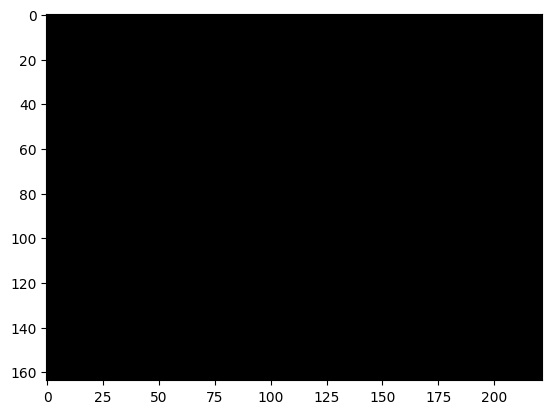

In [118]:
background_img = np.zeros(img.data[0:3].transpose(1, 2, 0).shape)
#initially 
plt.imshow(background_img)
print(background_img.shape)

In [119]:
def create_median_image(images_path):

    first_img = rioxarray.open_rasterio(images_path[0])

    width, height = first_img.data[0:3].transpose(1, 2, 0).shape[0:2]
    num_images = len(images_path)

    red_values = np.zeros(( width,height, num_images), dtype=np.uint8)
    green_values = np.zeros(( width,height, num_images), dtype=np.uint8)
    blue_values = np.zeros(( width,height, num_images), dtype=np.uint8)


    for i,j in enumerate(img_path):
        img = rioxarray.open_rasterio(j).data[0:3].transpose(1, 2, 0)
        red_values[:, :, i], green_values[:, :, i], blue_values[:, :, i] = img[:, :, 0], img[:, :, 1], img[:, :, 2]
    
    red_median = np.median(red_values, axis=2)
    green_median = np.median(green_values, axis=2)
    blue_median = np.median(blue_values, axis=2)
    img_arr = np.uint8(np.dstack((red_median, green_median, blue_median)))
    median_image = Image.fromarray(img_arr)
    
    return img_arr, median_image


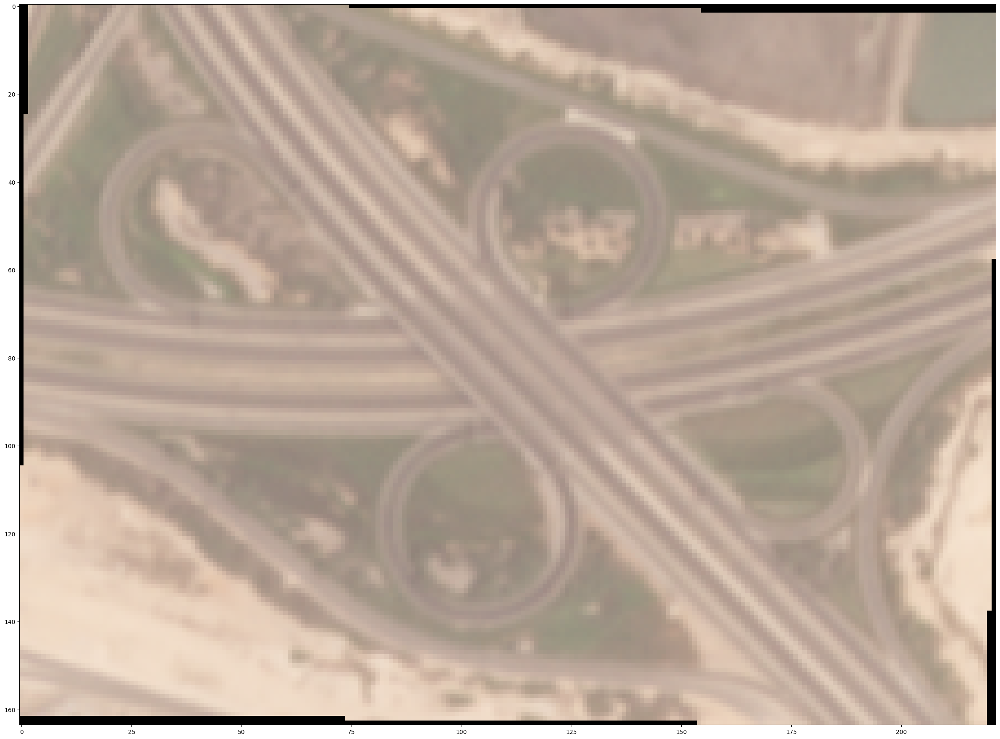

In [120]:
out, _ = create_median_image(img_path)
plt.figure(figsize=(30, 30))
plt.imshow(out)

### Ploting Median Image vs other images


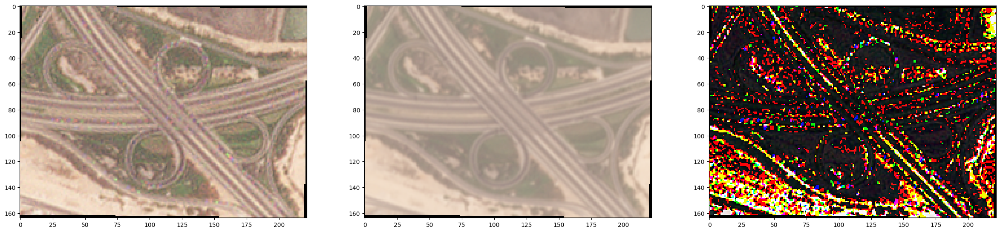

In [121]:
###Ploting Median Image vs other images
eg_img_1 = rioxarray.open_rasterio('/home/akansh-i2sc/Desktop/Research@Societal/detect-car-LR/data/AlAinRoad-Dubai/adb6abf2-14b1-4760-9ec2-d4267f564bde/PSScene/20210801_065621_73_2254_3B_Visual_clip.tif').data[0:3].transpose(1, 2, 0)
out, _ = create_median_image(img_path)

plt.figure(figsize=(40, 40))
plt.subplot(141)
plt.imshow(eg_img_1)
plt.subplot(142)
plt.imshow(out)
plt.subplot(143)
plt.imshow(out-eg_img_1)
# plt.subplot(144)
# a = out-eg_img_1
# plt.imshow(a[:,:,0] + a[:,:,1] + a[:,:,2], cmap='gray')

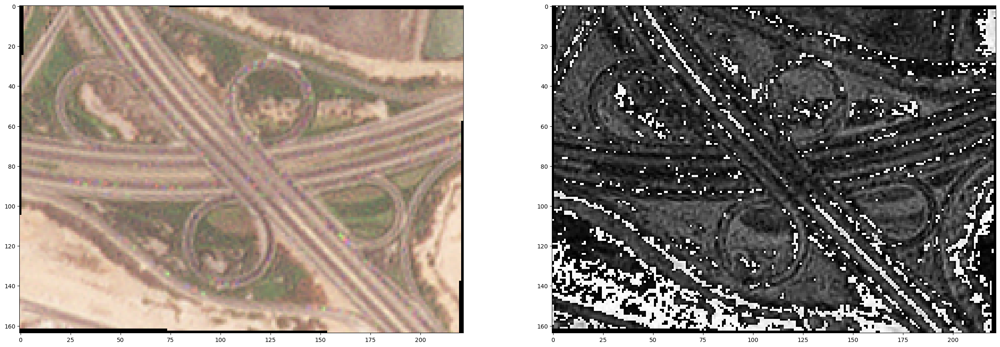

In [122]:
plt.figure(figsize=(30, 30))
plt.subplot(121)
plt.imshow(eg_img_1)
plt.subplot(122)
a = out-eg_img_1
plt.imshow(a[:,:,0] + a[:,:,1] + a[:,:,2], cmap='gray')


In [123]:
import cv2
import matplotlib.pyplot as plt

def plot_rgb_histogram(image):
    # Split the image into RGB channels
    red_channel = image[:,:,0]
    green_channel = image[:,:,1]
    blue_channel = image[:,:,2]

    # Calculate the histograms for each channel
    red_histogram = cv2.calcHist([red_channel], [0], None, [256], [0, 256])
    green_histogram = cv2.calcHist([green_channel], [0], None, [256], [0, 256])
    blue_histogram = cv2.calcHist([blue_channel], [0], None, [256], [0, 256])

    # Plot the histograms
    plt.figure(figsize=(10, 5))

    plt.subplot(131)
    plt.title('Red Channel Histogram')
    plt.xlabel('Pixel Value')
    plt.ylabel('Frequency')
    plt.plot(red_histogram, color='red')
    plt.xlim([0, 256])

    plt.subplot(132)
    plt.title('Green Channel Histogram')
    plt.xlabel('Pixel Value')
    plt.ylabel('Frequency')
    plt.plot(green_histogram, color='green')
    plt.xlim([0, 256])

    plt.subplot(133)
    plt.title('Blue Channel Histogram')
    plt.xlabel('Pixel Value')
    plt.ylabel('Frequency')
    plt.plot(blue_histogram, color='blue')
    plt.xlim([0, 256])

    plt.tight_layout()
    plt.show()



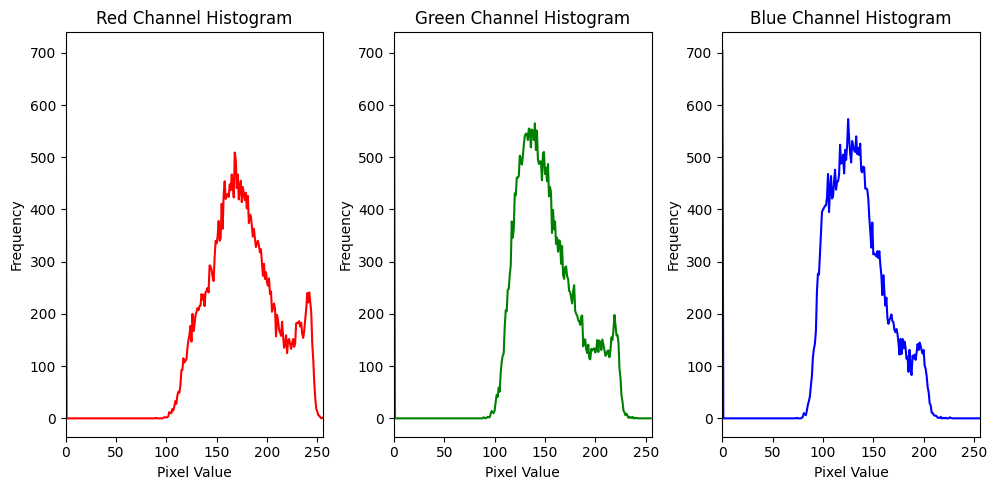

In [124]:
plot_rgb_histogram(eg_img_1)

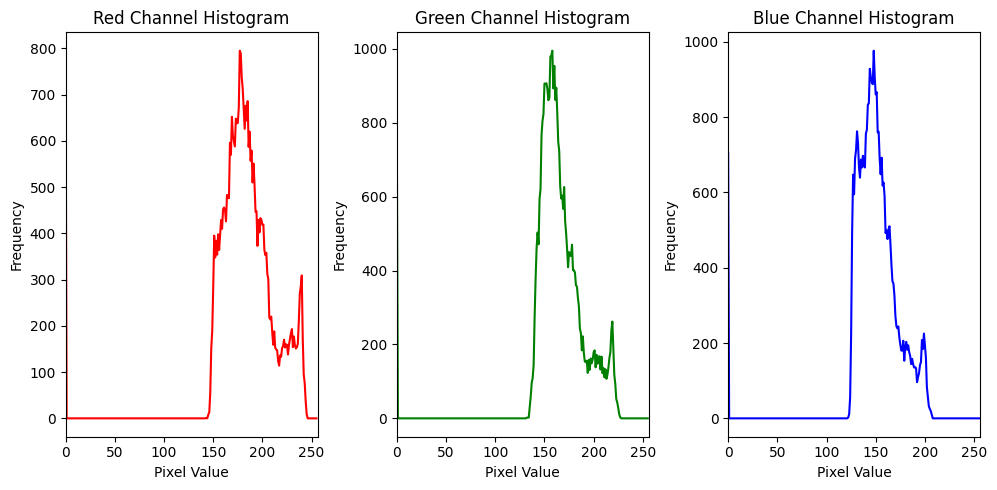

In [125]:
plot_rgb_histogram(out)

In [126]:
import cv2
import numpy as np

def histogram_equalization(img):
    # Load the image
    # Split the image into color channels
    channels = [img[:, :, 0], img[:, :, 1], img[:, :, 2]]

    # Apply histogram equalization to each channel
    equalized_channels = []
    for channel in channels:
        equalized_channel = cv2.equalizeHist(channel)
        equalized_channels.append(equalized_channel)

    # Merge the equalized channels back into an RGB image
    equalized_image = cv2.merge(equalized_channels)

    return equalized_image


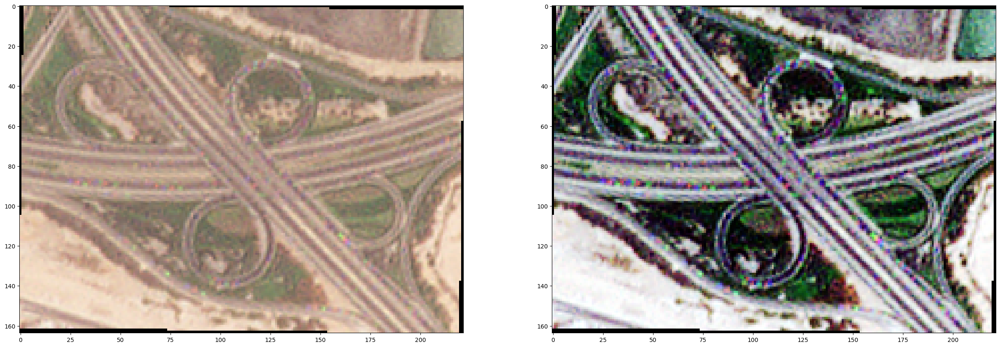

In [127]:
hist_eq_input = histogram_equalization(eg_img_1)
plt.figure(figsize=(30, 30))    
plt.subplot(121)
plt.imshow(eg_img_1)
plt.subplot(122)
plt.imshow(hist_eq_input)

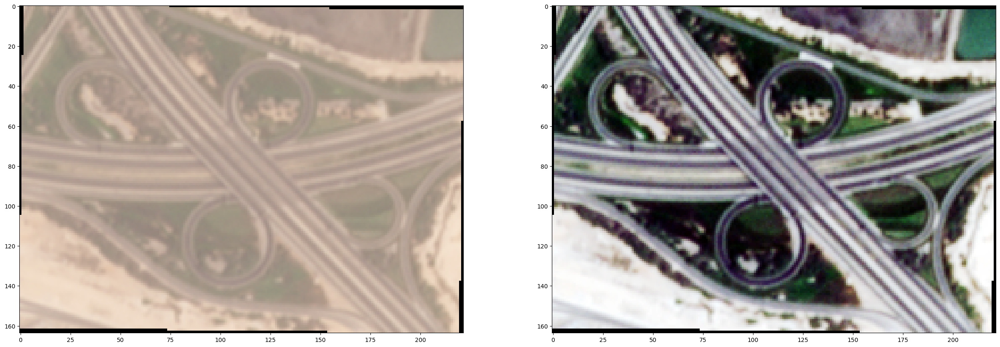

In [128]:
hist_eq_out = histogram_equalization(out)
plt.figure(figsize=(30, 30))    
plt.subplot(121)
plt.imshow(out)
plt.subplot(122)
plt.imshow(hist_eq_out)

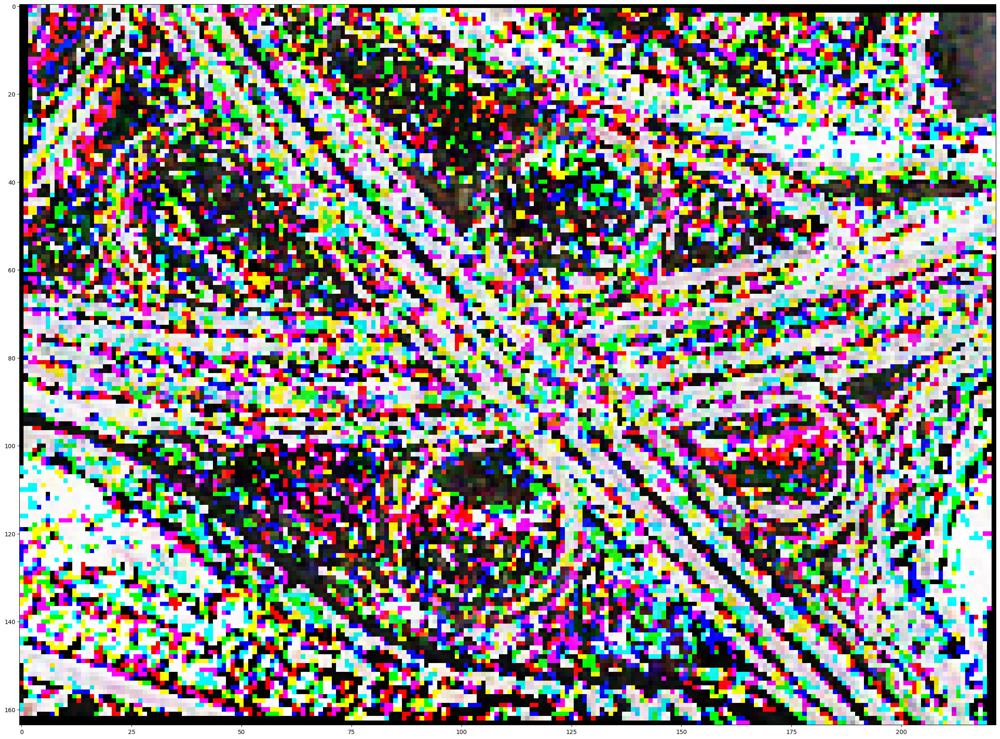

In [129]:
plt.figure(figsize=(30, 30))
plt.imshow(hist_eq_input-hist_eq_out)

In [130]:
equalized_image = histogram_equalization(eg_img_1)

### Radimetric Correction

In [131]:
import numpy as np
import cv2

def radiometric_correction(reference_image, input_image):
    # Convert images to floating point data type
    ref_img = reference_image.astype(np.float32)
    input_img = input_image.astype(np.float32)

    # Calculate mean pixel values for each color channel in reference and input images
    ref_mean = np.mean(ref_img, axis=(0, 1))
    input_mean = np.mean(input_img, axis=(0, 1))

    # Compute scaling factors for each color channel
    scale_factors = ref_mean / input_mean

    # Apply scaling factors to each color channel of the input image
    corrected_img = input_img * scale_factors

    # Clip pixel values to the valid range [0, 255]
    corrected_img = np.clip(corrected_img, 0, 255)

    # Convert corrected image back to 8-bit unsigned integer
    corrected_img = corrected_img.astype(np.uint8)

    return corrected_img



In [132]:
rad_correct_img = radiometric_correction(out, eg_img_1)

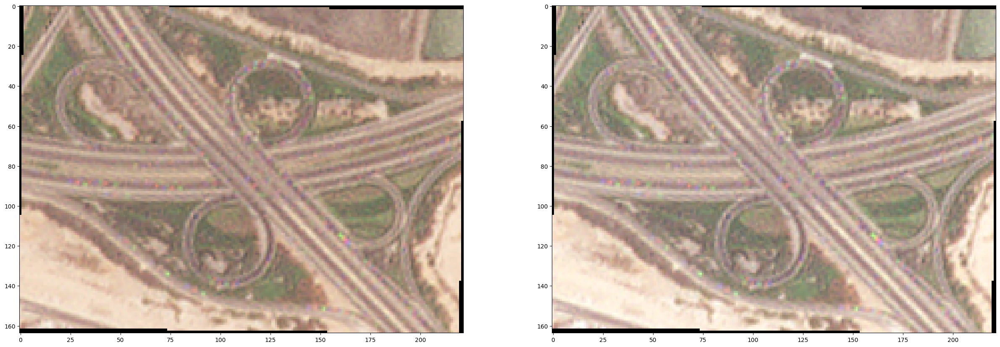

In [133]:
plt.figure(figsize=(30, 30))
plt.subplot(121)
plt.imshow(eg_img_1)
plt.subplot(122)
plt.imshow(rad_correct_img)

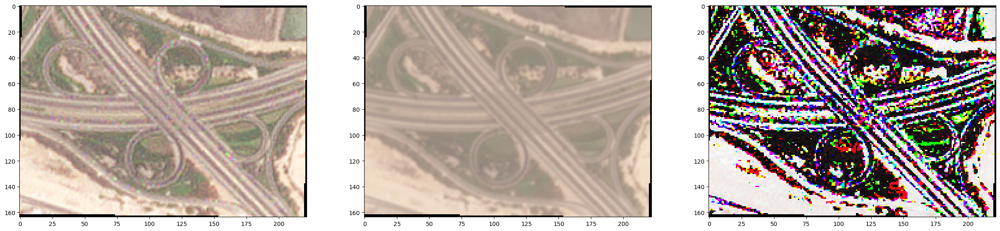

In [134]:
plt.figure(figsize=(30, 30))
plt.subplot(131)
plt.imshow(rad_correct_img)
plt.subplot(132)
plt.imshow(out)
plt.subplot(133)
plt.imshow(out-rad_correct_img)

### Median filter on one image

In [135]:
import cv2

def apply_median_filter(image, k = 3):
    # Apply the median filter to each color channel
    filtered_channels = [cv2.medianBlur(image[:,:,i], ksize=k) for i in range(3)]

    # Merge the filtered color channels back into an RGB image
    filtered_image = cv2.merge(filtered_channels)
    return filtered_image


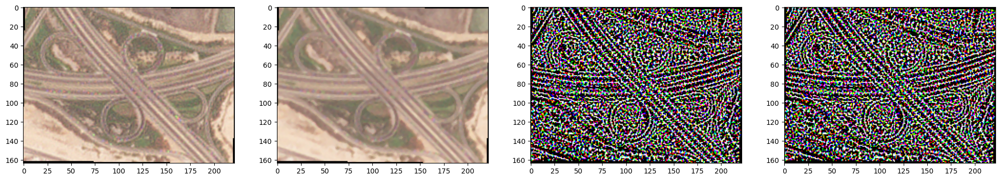

In [136]:
eg_img_1 = rioxarray.open_rasterio('/home/akansh-i2sc/Desktop/Research@Societal/detect-car-LR/data/AlAinRoad-Dubai/adb6abf2-14b1-4760-9ec2-d4267f564bde/PSScene/20210801_065621_73_2254_3B_Visual_clip.tif').data[0:3].transpose(1, 2, 0)

plt.figure(figsize=(25, 25))
plt.subplot(141)    
plt.imshow(eg_img_1)
plt.subplot(142)
plt.imshow(apply_median_filter(eg_img_1))
plt.subplot(143)
plt.imshow(eg_img_1-apply_median_filter(eg_img_1))
plt.subplot(144)
plt.imshow(np.abs(eg_img_1-apply_median_filter(eg_img_1)))


# filtered_image = apply_median_filter(eg_img_1)

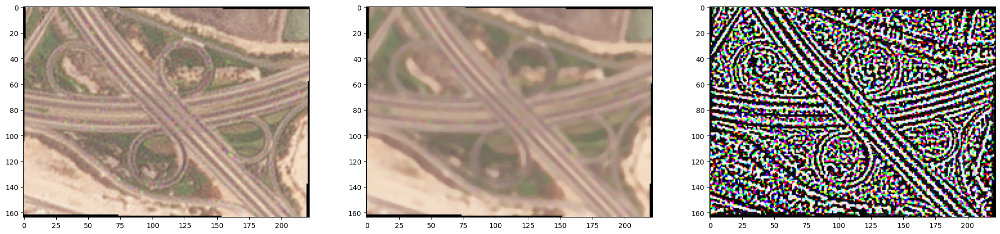

In [137]:
eg_img_1 = rioxarray.open_rasterio('/home/akansh-i2sc/Desktop/Research@Societal/detect-car-LR/data/AlAinRoad-Dubai/adb6abf2-14b1-4760-9ec2-d4267f564bde/PSScene/20210801_065621_73_2254_3B_Visual_clip.tif').data[0:3].transpose(1, 2, 0)

plt.figure(figsize=(25, 25))
plt.subplot(131)    
plt.imshow(eg_img_1)
plt.subplot(132)
plt.imshow(apply_median_filter(eg_img_1, k=5))
plt.subplot(133)
plt.imshow(eg_img_1-apply_median_filter(eg_img_1, k=5))


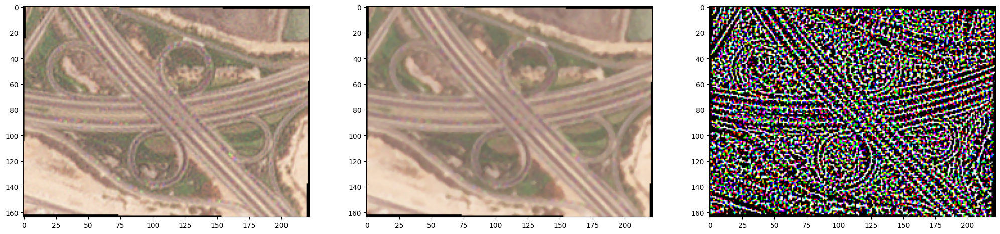

In [138]:
eg_img_1 = rioxarray.open_rasterio('/home/akansh-i2sc/Desktop/Research@Societal/detect-car-LR/data/AlAinRoad-Dubai/adb6abf2-14b1-4760-9ec2-d4267f564bde/PSScene/20210801_065621_73_2254_3B_Visual_clip.tif').data[0:3].transpose(1, 2, 0)

plt.figure(figsize=(25, 25))
plt.subplot(131)    
plt.imshow(eg_img_1)
plt.subplot(132)
plt.imshow(apply_median_filter(eg_img_1))
plt.subplot(133)
plt.imshow(eg_img_1-apply_median_filter(eg_img_1))


### NL-Means Denoising


In [139]:
### NL-Means Denoising
import cv2

def apply_nl_means_denoising(image, h = 3, template_window_size = 7, search_window_size = 21):
    # Apply the non-local means filter to each color channel
    filtered_channels = [cv2.fastNlMeansDenoising(image[:,:,i], h=h, 
                                                  templateWindowSize=template_window_size, 
                                                  searchWindowSize=search_window_size) for i in range(3)]

    # Merge the filtered color channels back into an RGB image
    filtered_image = cv2.merge(filtered_channels)
    return filtered_image

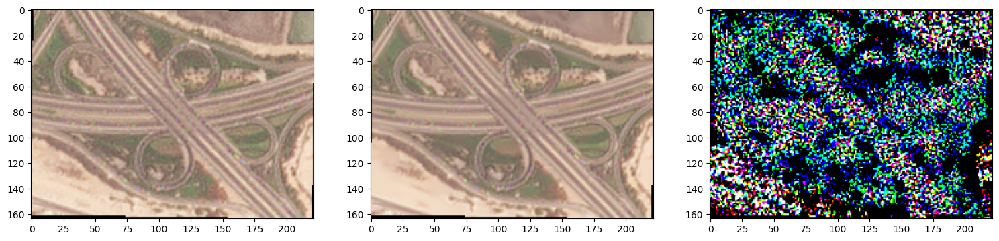

In [140]:
plt.figure(figsize=(25, 25))    
plt.subplot(141)
plt.imshow(eg_img_1)
plt.subplot(142)
plt.imshow(apply_nl_means_denoising(eg_img_1, h=5))
plt.subplot(143)
plt.imshow(eg_img_1-apply_nl_means_denoising(eg_img_1, h=5))
# plt.subplot(144)
# plt.imshow(np.abs(eg_img_1-apply_nl_means_denoising(eg_img_1)))


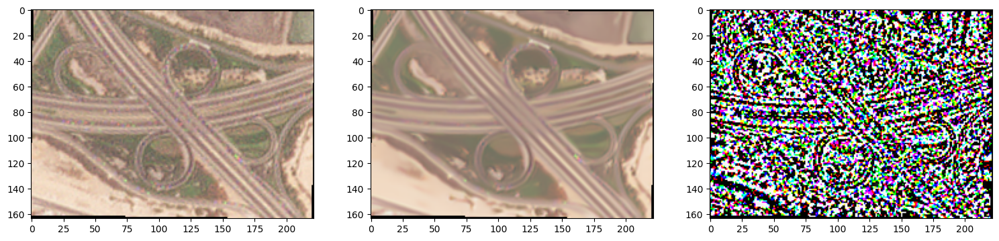

In [141]:
#h = 10
plt.figure(figsize=(25, 25))
plt.subplot(141)
plt.imshow(eg_img_1)
plt.subplot(142)    
plt.imshow(apply_nl_means_denoising(eg_img_1, h=10))
plt.subplot(143)
plt.imshow(eg_img_1-apply_nl_means_denoising(eg_img_1, h=10))

### Experiment 2: Changing the dataset: parking lot Saarbazar

In [142]:
img_path = glob.glob("/home/akansh-i2sc/Desktop/Research@Societal/detect-car-LR/data/Saarbasar/*/*/*.tif")
print(len(img_path))

250


In [143]:
img = rioxarray.open_rasterio(img_path[0])

for i in img_path:
    img = rioxarray.open_rasterio(i)
    assert img.shape == (4, 142, 136)
print(f"shape is correct{img.shape}")

shape is correct(4, 142, 136)


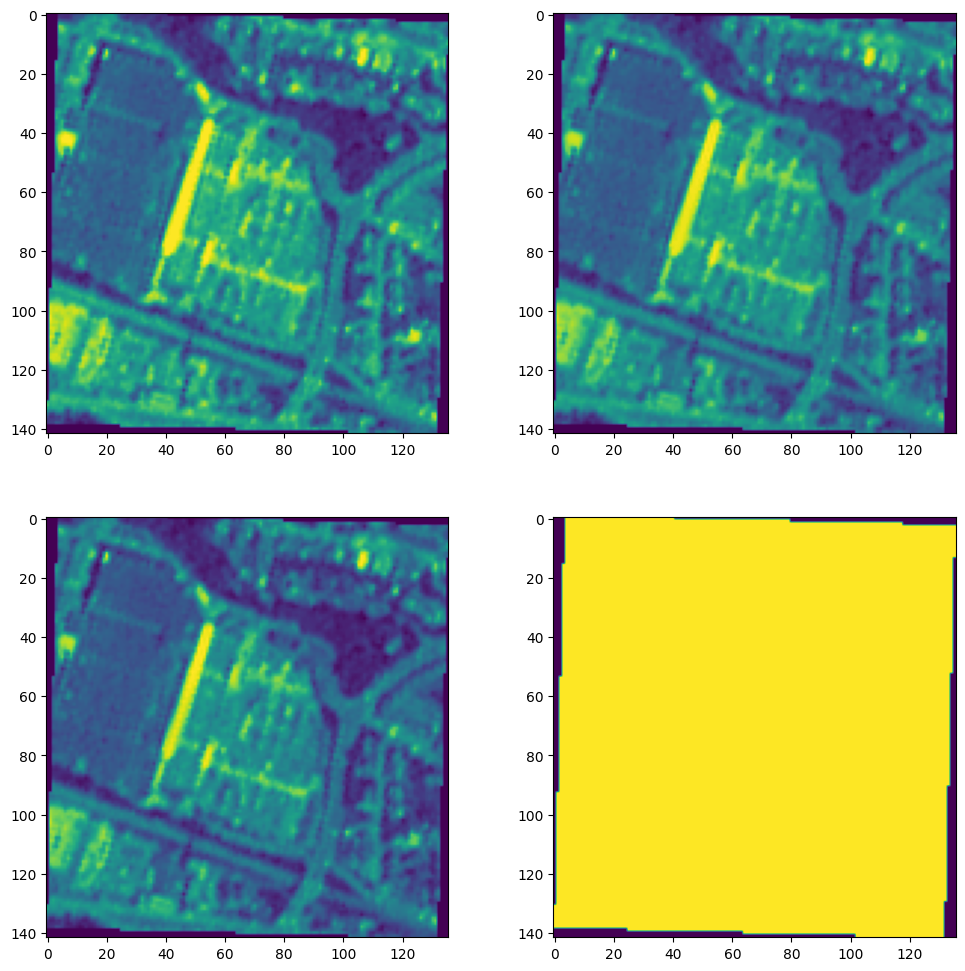

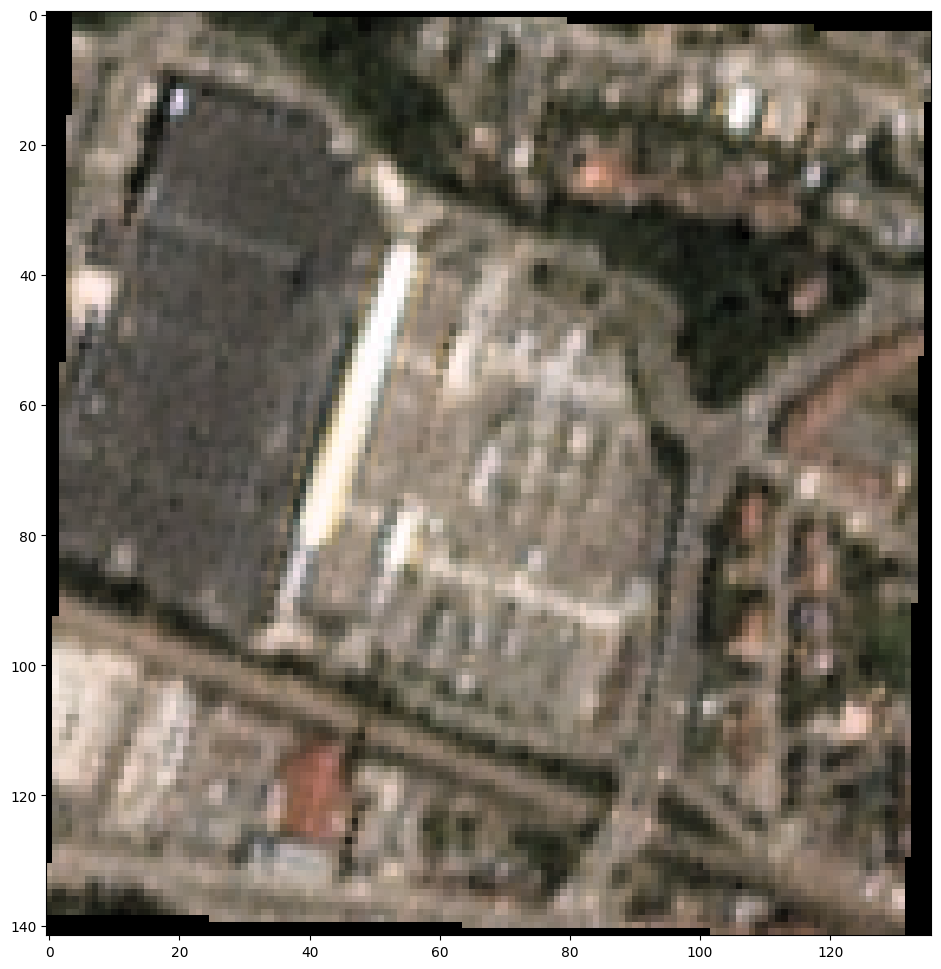

In [144]:
#plot all bands of the image
plt.figure(figsize=(12, 12))
plt.subplot(221)
plt.imshow(img.data[0]) 
plt.subplot(222)    
plt.imshow(img.data[1])
plt.subplot(223)
plt.imshow(img.data[2])
plt.subplot(224)
plt.imshow(img.data[3])

#plotting the first three bands of the image
plt.figure(figsize=(12, 12))
plt.imshow(img.data[0:3].transpose(1, 2, 0))

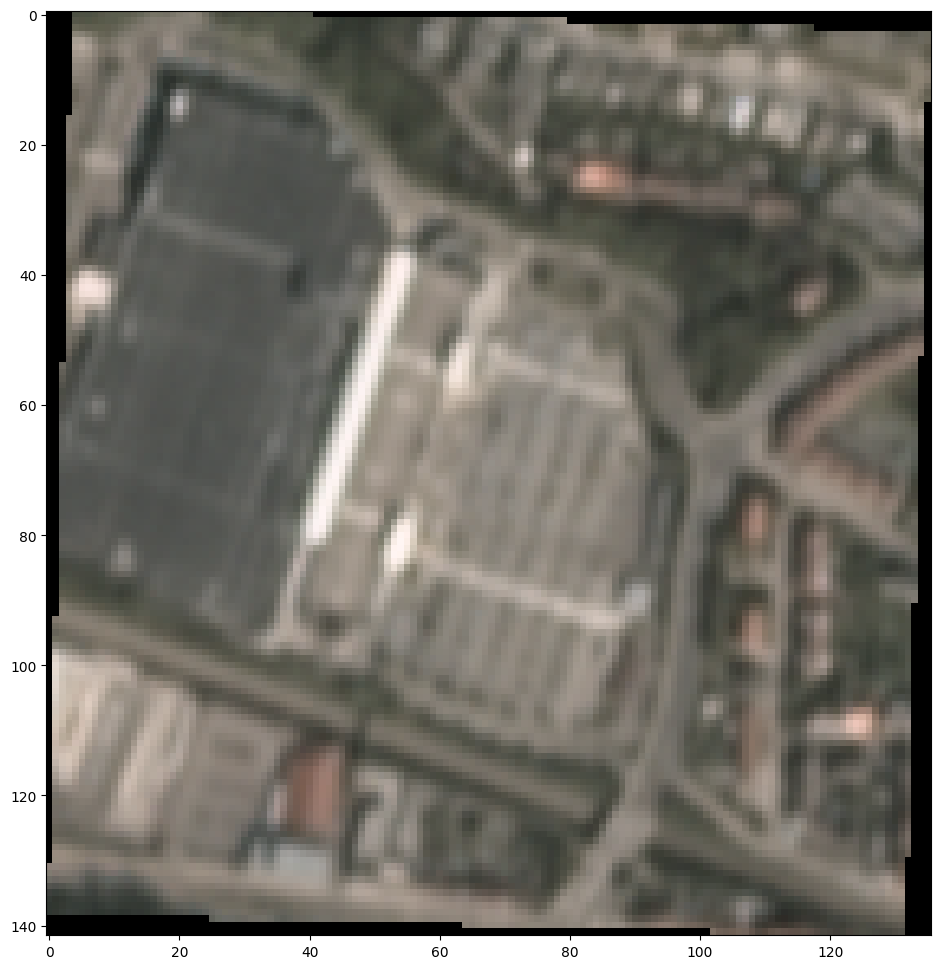

In [145]:
out, _ = create_median_image(img_path)
plt.figure(figsize=(12, 12))
plt.imshow(out)

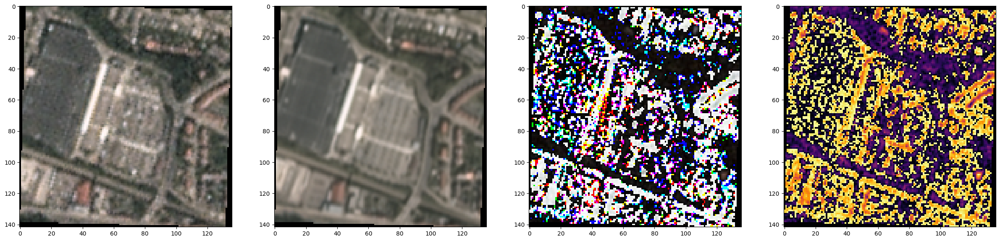

In [146]:
eg_img_1 = rioxarray.open_rasterio('/home/akansh-i2sc/Desktop/Research@Societal/detect-car-LR/data/Saarbasar/c40e4b0a-3c0d-408f-9022-67bc16fac2b8/PSScene/20170828_094335_103d_3B_Visual_clip.tif').data[0:3].transpose(1, 2, 0)
out, _ = create_median_image(img_path)

plt.figure(figsize=(30, 30))
plt.subplot(141)
plt.imshow(eg_img_1)
plt.subplot(142)
plt.imshow(out)
plt.subplot(143)
plt.imshow(out-eg_img_1)
plt.subplot(144)
a = out-eg_img_1
plt.imshow(a[:,:,0]+a[:,:,1]+a[:,:,2], cmap='inferno')

### Experiment 3: Correlation of day with Pixel: Abu-Dubai

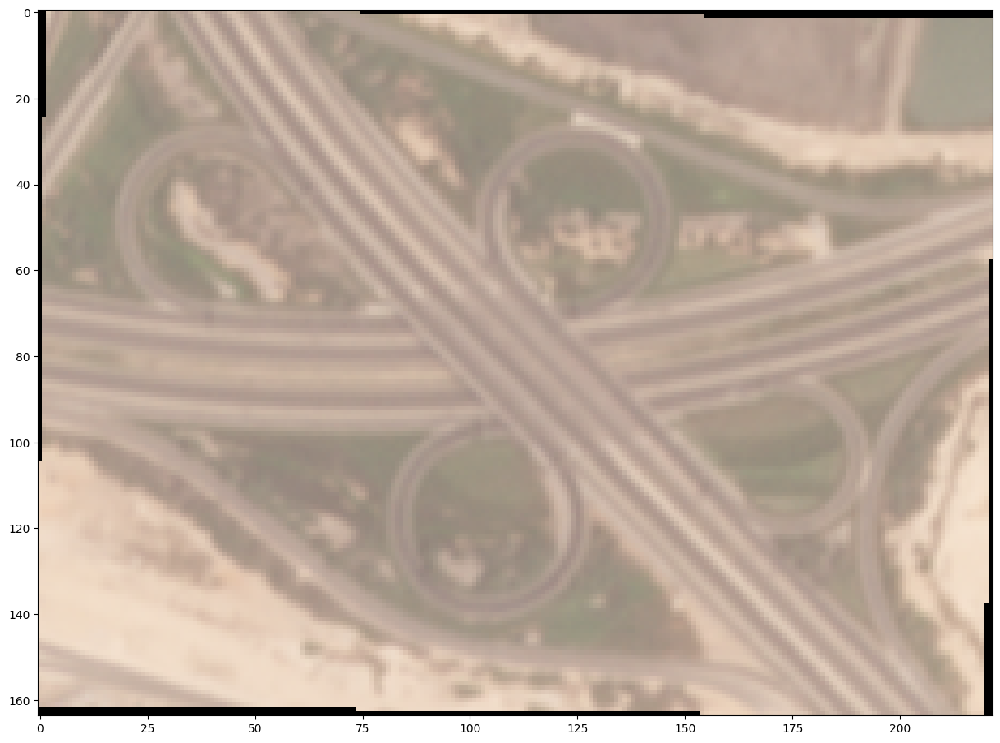

In [198]:
img_path = glob.glob("/home/akansh-i2sc/Desktop/Research@Societal/detect-car-LR/data/AlAinRoad-Dubai/*/*/*.tif")
out, _ = create_median_image(img_path)
plt.figure(figsize=(15, 15))
plt.imshow(out)

In [199]:
import datetime

def find_day(date_string):
    try:
        date = datetime.datetime.strptime(date_string, "%Y-%m-%d")
        day = date.strftime("%A")
        return day
    except ValueError:
        return "Invalid date format. Please provide the date in YYYY-MM-DD format."


In [200]:
pixels = []
days = []
for i in img_path:
    img = rioxarray.open_rasterio(i).data[0:3].transpose(1, 2, 0)
    a = out-img
    sum_channels = a[:,:,0]+a[:,:,1]+a[:,:,2]
    pixels.append(np.sum(sum_channels >150))


    date_in = i.split('/')[-1].split('_')[0]
    year = date_in[0:4]
    month = date_in[4:6]
    day = date_in[6:8]  
    date_string = f"{year}-{month}-{day}"
    days.append(find_day(date_string))


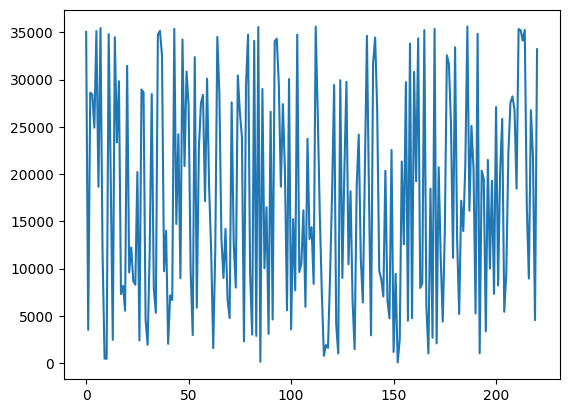

In [201]:
plt.plot(pixels)

In [202]:
days = np.array(days)
#index of all the Mondays in day array
monday_index = np.where(days == 'Monday')[0]
tuesday_index = np.where(days == 'Tuesday')[0]
wednesday_index = np.where(days == 'Wednesday')[0]
thursday_index = np.where(days == 'Thursday')[0]
friday_index = np.where(days == 'Friday')[0]
saturday_index = np.where(days == 'Saturday')[0]
sunday_index = np.where(days == 'Sunday')[0]


In [203]:
#find the value of pixels on all the Mondays
medians = []
monday_pixels = np.array(pixels)[monday_index]
medians.append(np.median(monday_pixels))
tuesday_pixels = np.array(pixels)[tuesday_index]
medians.append(np.median(tuesday_pixels))
wednesday_pixels = np.array(pixels)[wednesday_index]
medians.append(np.median(wednesday_pixels))
thursday_pixels = np.array(pixels)[thursday_index]
medians.append(np.median(thursday_pixels))
friday_pixels = np.array(pixels)[friday_index]
medians.append(np.median(friday_pixels))
saturday_pixels = np.array(pixels)[saturday_index]
medians.append(np.median(saturday_pixels))
sunday_pixels = np.array(pixels)[sunday_index]
medians.append(np.median(sunday_pixels))

Text(0.5, 1.0, 'Median of White pixels vs Days of the week(ABU-DUBAI)')

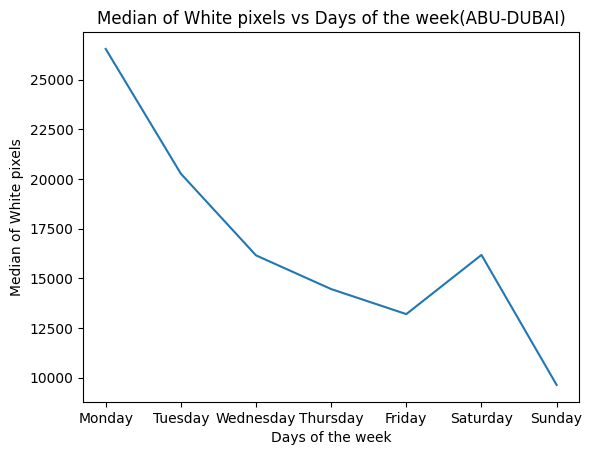

In [204]:
plt.plot(medians)
plt.xticks(np.arange(7), ('Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday'))
plt.xlabel('Days of the week')
plt.ylabel('Median of White pixels')
plt.title('Median of White pixels vs Days of the week(ABU-DUBAI)')

#### Hornbach

In [170]:
img_path = glob.glob("/home/akansh-i2sc/Desktop/Research@Societal/detect-car-LR/data/Hornbach/680b20f9-92d6-48a9-9396-6731eda48234/PSScene/*.tif")
img_path

['/home/akansh-i2sc/Desktop/Research@Societal/detect-car-LR/data/Hornbach/680b20f9-92d6-48a9-9396-6731eda48234/PSScene/20210614_095011_05_222f_3B_Visual_clip.tif',
 '/home/akansh-i2sc/Desktop/Research@Societal/detect-car-LR/data/Hornbach/680b20f9-92d6-48a9-9396-6731eda48234/PSScene/20220705_101959_04_2414_3B_Visual_clip.tif',
 '/home/akansh-i2sc/Desktop/Research@Societal/detect-car-LR/data/Hornbach/680b20f9-92d6-48a9-9396-6731eda48234/PSScene/20200417_100812_1035_3B_Visual_clip.tif',
 '/home/akansh-i2sc/Desktop/Research@Societal/detect-car-LR/data/Hornbach/680b20f9-92d6-48a9-9396-6731eda48234/PSScene/20201104_095118_16_2264_3B_Visual_clip.tif',
 '/home/akansh-i2sc/Desktop/Research@Societal/detect-car-LR/data/Hornbach/680b20f9-92d6-48a9-9396-6731eda48234/PSScene/20210703_100808_1034_3B_Visual_clip.tif',
 '/home/akansh-i2sc/Desktop/Research@Societal/detect-car-LR/data/Hornbach/680b20f9-92d6-48a9-9396-6731eda48234/PSScene/20210907_101010_1002_3B_Visual_clip.tif',
 '/home/akansh-i2sc/Deskt

In [171]:
def create_median_image(images_path):

    first_img = rioxarray.open_rasterio(images_path[0])

    width, height = first_img.data[0:3].transpose(1, 2, 0).shape[0:2]
    num_images = len(images_path)

    red_values = np.zeros(( width,height, num_images), dtype=np.uint8)
    green_values = np.zeros(( width,height, num_images), dtype=np.uint8)
    blue_values = np.zeros(( width,height, num_images), dtype=np.uint8)


    for i,j in enumerate(img_path):
        try: 
            img = rioxarray.open_rasterio(j).data[0:3].transpose(1, 2, 0)
            red_values[:, :, i], green_values[:, :, i], blue_values[:, :, i] = img[:, :, 0], img[:, :, 1], img[:, :, 2]
        except:
            pass
        
    red_median = np.median(red_values, axis=2)
    green_median = np.median(green_values, axis=2)
    blue_median = np.median(blue_values, axis=2)
    img_arr = np.uint8(np.dstack((red_median, green_median, blue_median)))
    median_image = Image.fromarray(img_arr)
    
    return img_arr, median_image

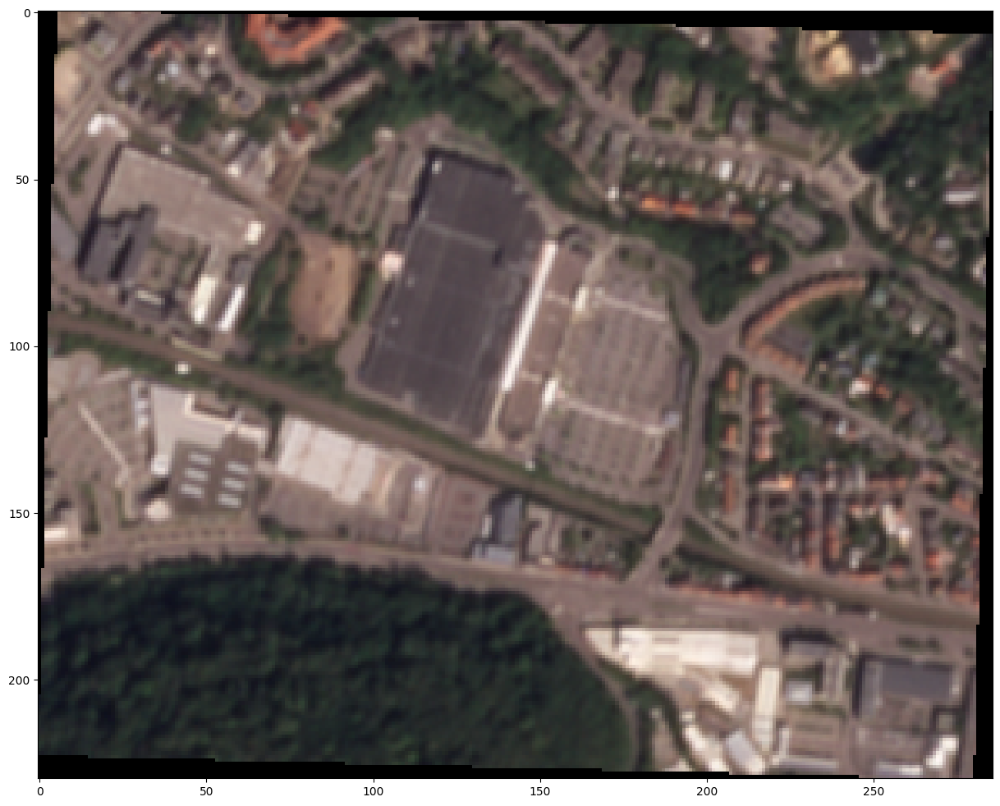

In [172]:
out, _ = create_median_image(img_path)
plt.figure(figsize=(15, 15))
plt.imshow(out)

In [173]:
pixels = []
days = []
for i in img_path:
    try:
        img = rioxarray.open_rasterio(i).data[0:3].transpose(1, 2, 0)
        a = out-img
        sum_channels = a[:,:,0]+a[:,:,1]+a[:,:,2]
        pixels.append(np.sum(sum_channels >150))


        date_in = i.split('/')[-1].split('_')[0]
        year = date_in[0:4]
        month = date_in[4:6]
        day = date_in[6:8]  
        date_string = f"{year}-{month}-{day}"
        days.append(find_day(date_string))
    except:
        pass

In [174]:
days = np.array(days)
#index of all the Mondays in day array
monday_index = np.where(days == 'Monday')[0]
tuesday_index = np.where(days == 'Tuesday')[0]
wednesday_index = np.where(days == 'Wednesday')[0]
thursday_index = np.where(days == 'Thursday')[0]
friday_index = np.where(days == 'Friday')[0]
saturday_index = np.where(days == 'Saturday')[0]
sunday_index = np.where(days == 'Sunday')[0]


#find the value of pixels on all the Mondays
medians = []
monday_pixels = np.array(pixels)[monday_index]
medians.append(np.median(monday_pixels))
tuesday_pixels = np.array(pixels)[tuesday_index]
medians.append(np.median(tuesday_pixels))
wednesday_pixels = np.array(pixels)[wednesday_index]
medians.append(np.median(wednesday_pixels))
thursday_pixels = np.array(pixels)[thursday_index]
medians.append(np.median(thursday_pixels))
friday_pixels = np.array(pixels)[friday_index]
medians.append(np.median(friday_pixels))
saturday_pixels = np.array(pixels)[saturday_index]
medians.append(np.median(saturday_pixels))
sunday_pixels = np.array(pixels)[sunday_index]
medians.append(np.median(sunday_pixels))



Text(0.5, 1.0, 'Median of White pixels vs Days of the week(Hornbach)')

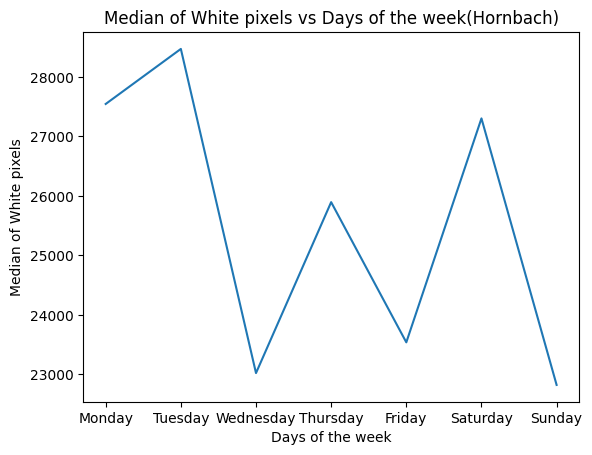

In [175]:
plt.plot(medians)
plt.xticks(np.arange(7), ('Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday'))
plt.xlabel('Days of the week')
plt.ylabel('Median of White pixels')
plt.title('Median of White pixels vs Days of the week(Hornbach)')

In [176]:
img_path = glob.glob("/home/akansh-i2sc/Desktop/Research@Societal/detect-car-LR/data/Globus/b95c5457-9046-4d44-be21-cb9a336707f7/PSScene/*.tif")


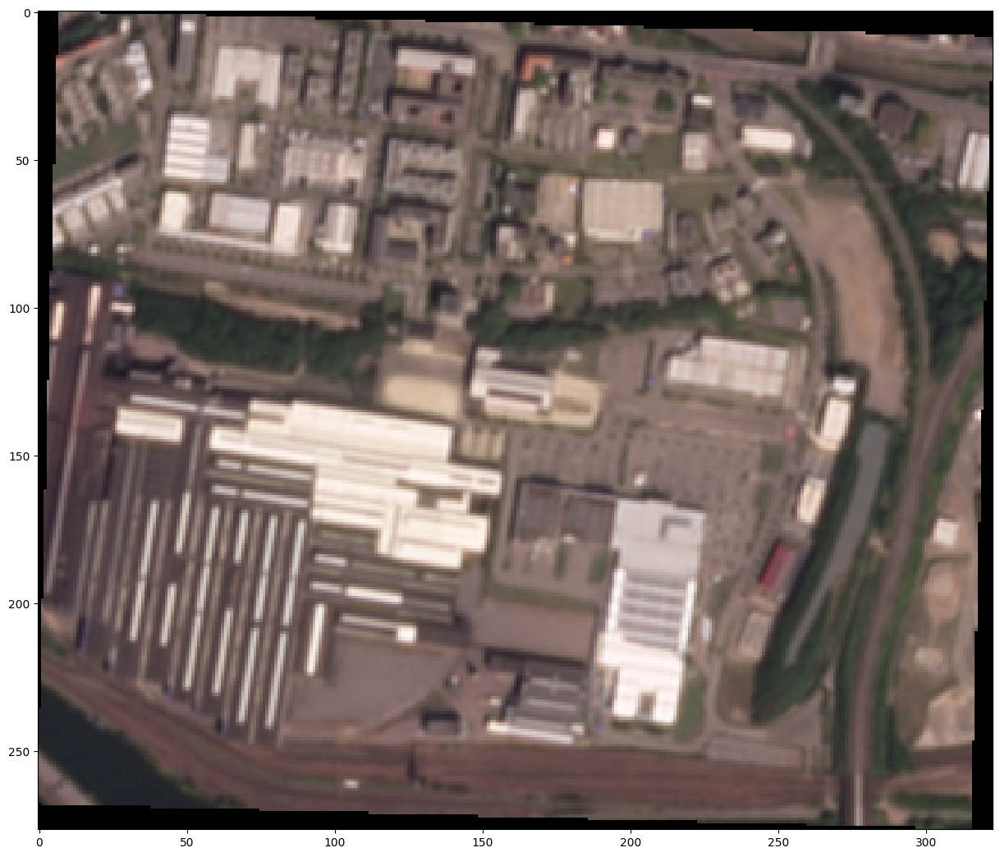

In [177]:
out, _ = create_median_image(img_path)
plt.figure(figsize=(15, 15))
plt.imshow(out)

In [178]:
pixels = []
days = []
for i in img_path:
    try:
        img = rioxarray.open_rasterio(i).data[0:3].transpose(1, 2, 0)
        a = out-img
        sum_channels = a[:,:,0]+a[:,:,1]+a[:,:,2]
        pixels.append(np.sum(sum_channels >150))


        date_in = i.split('/')[-1].split('_')[0]
        year = date_in[0:4]
        month = date_in[4:6]
        day = date_in[6:8]  
        date_string = f"{year}-{month}-{day}"
        days.append(find_day(date_string))
    except:
        pass

In [179]:
days = np.array(days)
#index of all the Mondays in day array
monday_index = np.where(days == 'Monday')[0]
tuesday_index = np.where(days == 'Tuesday')[0]
wednesday_index = np.where(days == 'Wednesday')[0]
thursday_index = np.where(days == 'Thursday')[0]
friday_index = np.where(days == 'Friday')[0]
saturday_index = np.where(days == 'Saturday')[0]
sunday_index = np.where(days == 'Sunday')[0]


#find the value of pixels on all the Mondays
medians = []
monday_pixels = np.array(pixels)[monday_index]
medians.append(np.median(monday_pixels))
tuesday_pixels = np.array(pixels)[tuesday_index]
medians.append(np.median(tuesday_pixels))
wednesday_pixels = np.array(pixels)[wednesday_index]
medians.append(np.median(wednesday_pixels))
thursday_pixels = np.array(pixels)[thursday_index]
medians.append(np.median(thursday_pixels))
friday_pixels = np.array(pixels)[friday_index]
medians.append(np.median(friday_pixels))
saturday_pixels = np.array(pixels)[saturday_index]
medians.append(np.median(saturday_pixels))
sunday_pixels = np.array(pixels)[sunday_index]
medians.append(np.median(sunday_pixels))


Text(0.5, 1.0, 'Median of White pixels vs Days of the week(Globus)')

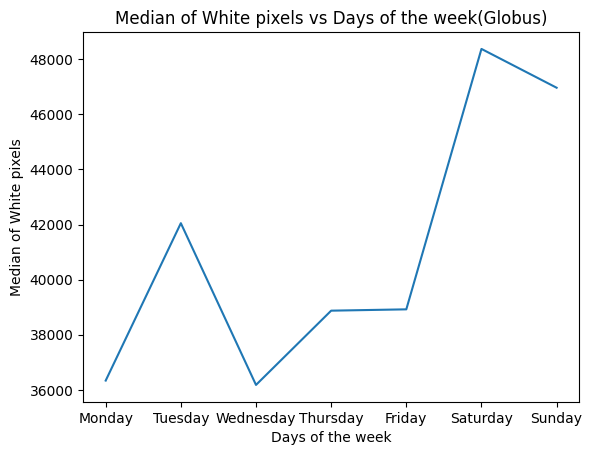

In [180]:
plt.plot(medians)
plt.xticks(np.arange(7), ('Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday'))
plt.xlabel('Days of the week')
plt.ylabel('Median of White pixels')
plt.title('Median of White pixels vs Days of the week(Globus)')

#### Bauhaus

In [181]:
img_path = glob.glob("/home/akansh-i2sc/Desktop/Research@Societal/detect-car-LR/data/Bauhaus/56400ab6-607a-42cc-ba87-9a9864f3c1f8/PSScene/*.tif")


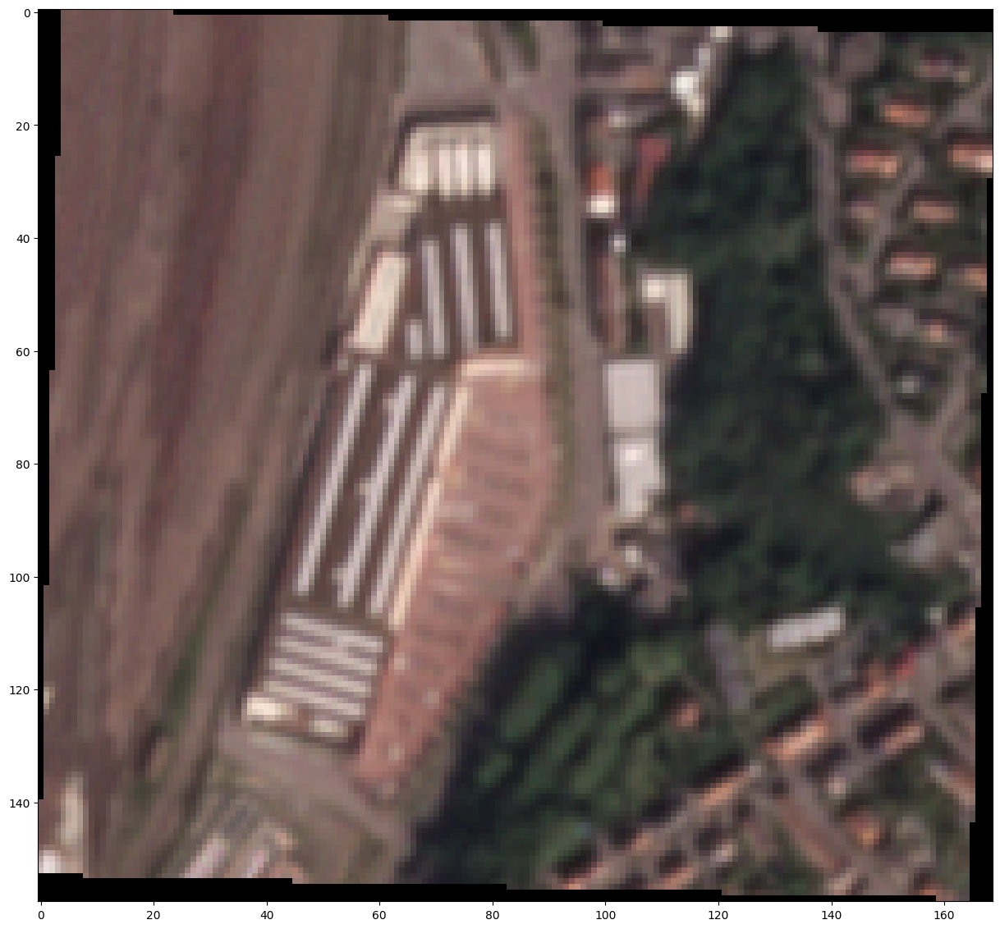

In [183]:
out, _ = create_median_image(img_path)
plt.figure(figsize=(15, 15))
plt.imshow(out)

In [184]:
pixels = []
days = []
for i in img_path:
    try:
        img = rioxarray.open_rasterio(i).data[0:3].transpose(1, 2, 0)
        a = out-img
        sum_channels = a[:,:,0]+a[:,:,1]+a[:,:,2]
        pixels.append(np.sum(sum_channels >150))


        date_in = i.split('/')[-1].split('_')[0]
        year = date_in[0:4]
        month = date_in[4:6]
        day = date_in[6:8]  
        date_string = f"{year}-{month}-{day}"
        days.append(find_day(date_string))
    except:
        pass

In [185]:
days = np.array(days)
#index of all the Mondays in day array
monday_index = np.where(days == 'Monday')[0]
tuesday_index = np.where(days == 'Tuesday')[0]
wednesday_index = np.where(days == 'Wednesday')[0]
thursday_index = np.where(days == 'Thursday')[0]
friday_index = np.where(days == 'Friday')[0]
saturday_index = np.where(days == 'Saturday')[0]
sunday_index = np.where(days == 'Sunday')[0]


#find the value of pixels on all the Mondays
medians = []
monday_pixels = np.array(pixels)[monday_index]
medians.append(np.median(monday_pixels))
tuesday_pixels = np.array(pixels)[tuesday_index]
medians.append(np.median(tuesday_pixels))
wednesday_pixels = np.array(pixels)[wednesday_index]
medians.append(np.median(wednesday_pixels))
thursday_pixels = np.array(pixels)[thursday_index]
medians.append(np.median(thursday_pixels))
friday_pixels = np.array(pixels)[friday_index]
medians.append(np.median(friday_pixels))
saturday_pixels = np.array(pixels)[saturday_index]
medians.append(np.median(saturday_pixels))
sunday_pixels = np.array(pixels)[sunday_index]
medians.append(np.median(sunday_pixels))

Text(0.5, 1.0, 'Median of White pixels vs Days of the week(Bauhaus)')

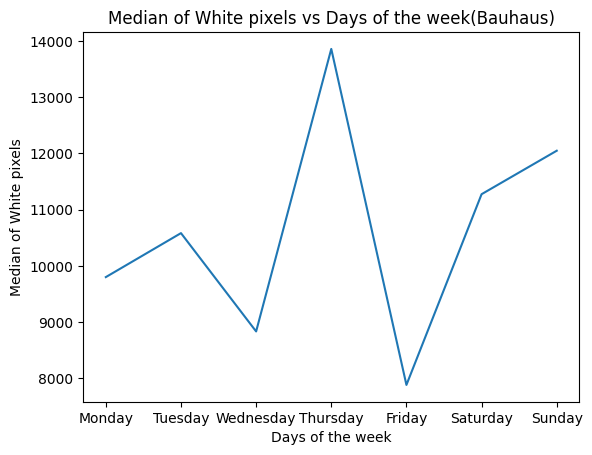

In [186]:
plt.plot(medians)
plt.xticks(np.arange(7), ('Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday'))
plt.xlabel('Days of the week')
plt.ylabel('Median of White pixels')
plt.title('Median of White pixels vs Days of the week(Bauhaus)')

#### Saarbasar

In [187]:
img_path = glob.glob("/home/akansh-i2sc/Desktop/Research@Societal/detect-car-LR/data/Saarbasar/c40e4b0a-3c0d-408f-9022-67bc16fac2b8/PSScene/*.tif")


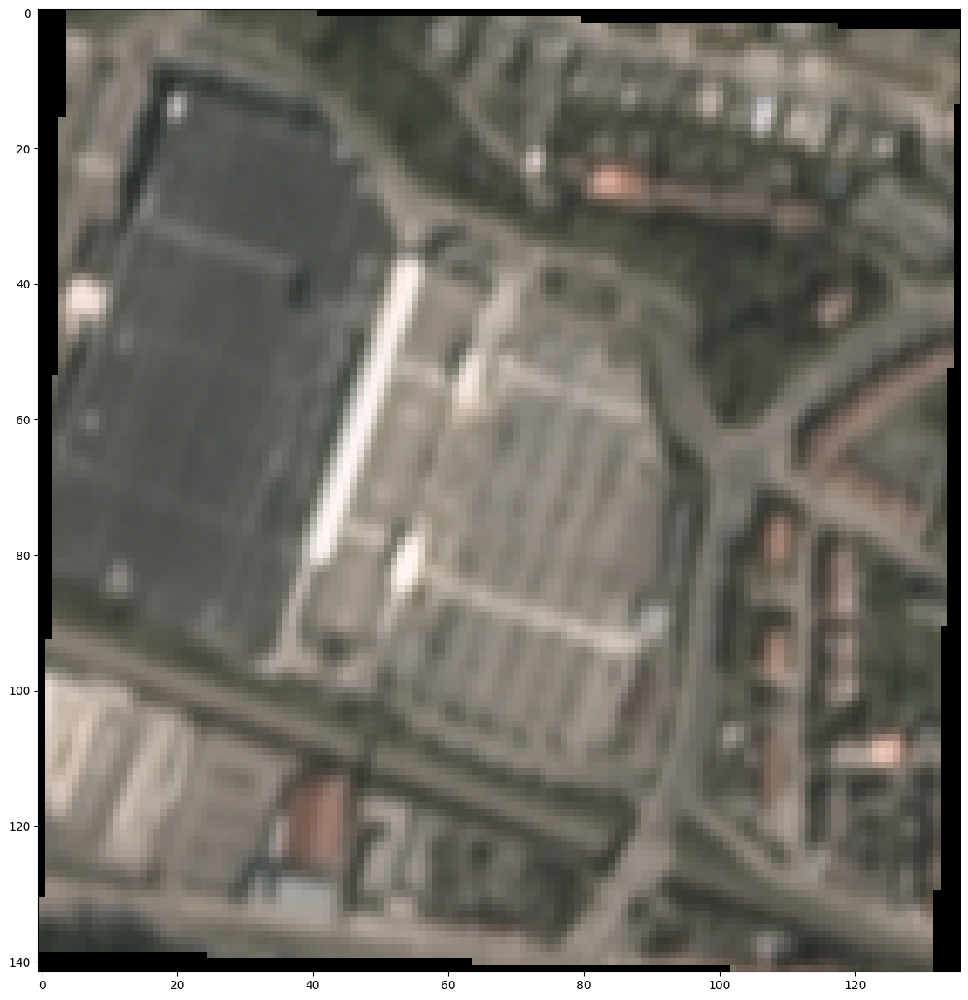

In [188]:
out, _ = create_median_image(img_path)
plt.figure(figsize=(15, 15))
plt.imshow(out)

In [189]:
pixels = []
days = []
for i in img_path:
    try:
        img = rioxarray.open_rasterio(i).data[0:3].transpose(1, 2, 0)
        a = out-img
        sum_channels = a[:,:,0]+a[:,:,1]+a[:,:,2]
        pixels.append(np.sum(sum_channels >150))


        date_in = i.split('/')[-1].split('_')[0]
        year = date_in[0:4]
        month = date_in[4:6]
        day = date_in[6:8]  
        date_string = f"{year}-{month}-{day}"
        days.append(find_day(date_string))
    except:
        pass

In [190]:
days = np.array(days)
#index of all the Mondays in day array
monday_index = np.where(days == 'Monday')[0]
tuesday_index = np.where(days == 'Tuesday')[0]
wednesday_index = np.where(days == 'Wednesday')[0]
thursday_index = np.where(days == 'Thursday')[0]
friday_index = np.where(days == 'Friday')[0]
saturday_index = np.where(days == 'Saturday')[0]
sunday_index = np.where(days == 'Sunday')[0]


#find the value of pixels on all the Mondays
medians = []
monday_pixels = np.array(pixels)[monday_index]
medians.append(np.median(monday_pixels))
tuesday_pixels = np.array(pixels)[tuesday_index]
medians.append(np.median(tuesday_pixels))
wednesday_pixels = np.array(pixels)[wednesday_index]
medians.append(np.median(wednesday_pixels))
thursday_pixels = np.array(pixels)[thursday_index]
medians.append(np.median(thursday_pixels))
friday_pixels = np.array(pixels)[friday_index]
medians.append(np.median(friday_pixels))
saturday_pixels = np.array(pixels)[saturday_index]
medians.append(np.median(saturday_pixels))
sunday_pixels = np.array(pixels)[sunday_index]
medians.append(np.median(sunday_pixels))

Text(0.5, 1.0, 'Median of White pixels vs Days of the week(Saarbasar)')

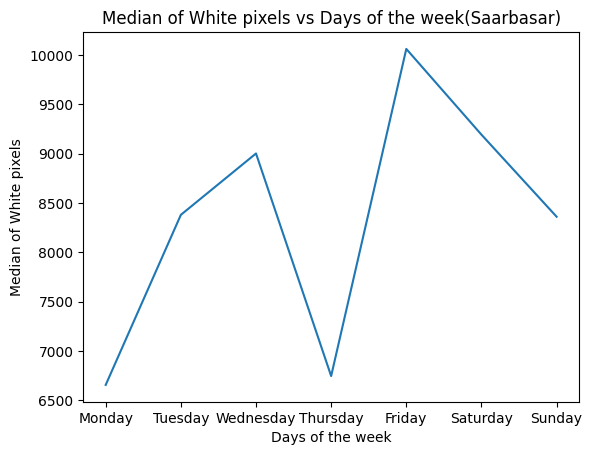

In [192]:
plt.plot(medians)
plt.xticks(np.arange(7), ('Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday'))
plt.xlabel('Days of the week')
plt.ylabel('Median of White pixels')
plt.title('Median of White pixels vs Days of the week(Saarbasar)')

#### Airport

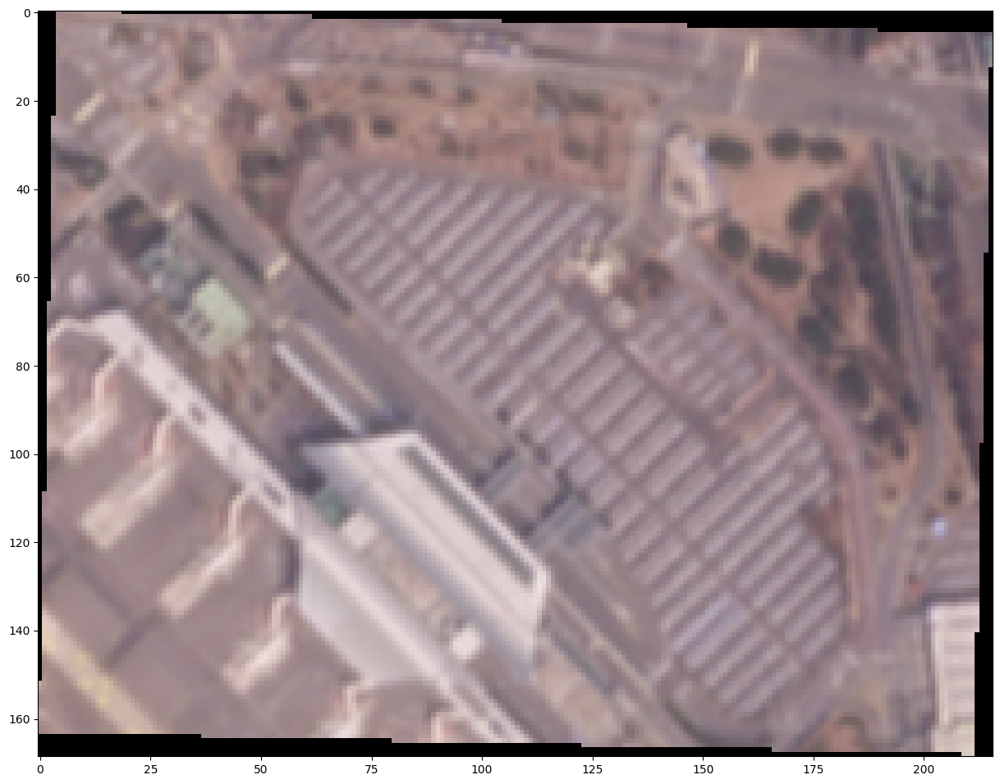

In [205]:
img_path = glob.glob("/home/akansh-i2sc/Desktop/Research@Societal/detect-car-LR/data/Gimpo-Airport/a52aff54-2187-46a2-913d-9459971f9fd8/PSScene/*.tif")
out, _ = create_median_image(img_path)
plt.figure(figsize=(15, 15))
plt.imshow(out)

In [206]:
pixels = []
days = []
for i in img_path:
    try:
        img = rioxarray.open_rasterio(i).data[0:3].transpose(1, 2, 0)
        a = out-img
        sum_channels = a[:,:,0]+a[:,:,1]+a[:,:,2]
        pixels.append(np.sum(sum_channels >150))


        date_in = i.split('/')[-1].split('_')[0]
        year = date_in[0:4]
        month = date_in[4:6]
        day = date_in[6:8]  
        date_string = f"{year}-{month}-{day}"
        days.append(find_day(date_string))
    except:
        pass

In [208]:
days = np.array(days)
#index of all the Mondays in day array
monday_index = np.where(days == 'Monday')[0]
tuesday_index = np.where(days == 'Tuesday')[0]
wednesday_index = np.where(days == 'Wednesday')[0]
thursday_index = np.where(days == 'Thursday')[0]
friday_index = np.where(days == 'Friday')[0]
saturday_index = np.where(days == 'Saturday')[0]
sunday_index = np.where(days == 'Sunday')[0]


#find the value of pixels on all the Mondays
medians = []
monday_pixels = np.array(pixels)[monday_index]
medians.append(np.median(monday_pixels))
tuesday_pixels = np.array(pixels)[tuesday_index]
medians.append(np.median(tuesday_pixels))
wednesday_pixels = np.array(pixels)[wednesday_index]
medians.append(np.median(wednesday_pixels))
thursday_pixels = np.array(pixels)[thursday_index]
medians.append(np.median(thursday_pixels))
friday_pixels = np.array(pixels)[friday_index]
medians.append(np.median(friday_pixels))
saturday_pixels = np.array(pixels)[saturday_index]
medians.append(np.median(saturday_pixels))
sunday_pixels = np.array(pixels)[sunday_index]
medians.append(np.median(sunday_pixels))

Text(0.5, 1.0, 'Median of White pixels vs Days of the week(Airport)')

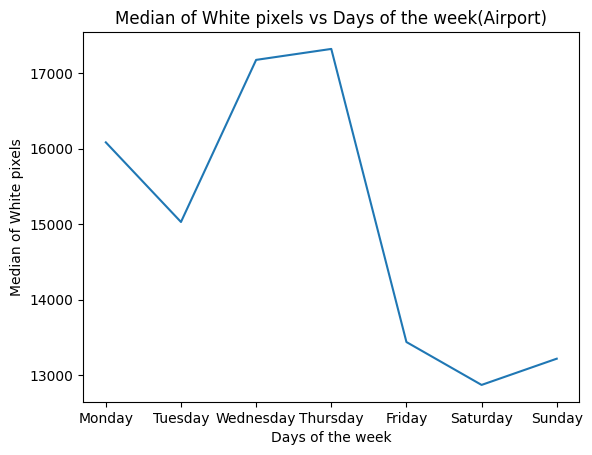

In [218]:
plt.plot(medians)
plt.xticks(np.arange(7), ('Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday'))
plt.xlabel('Days of the week')
plt.ylabel('Median of White pixels')
plt.title('Median of White pixels vs Days of the week(Airport)')

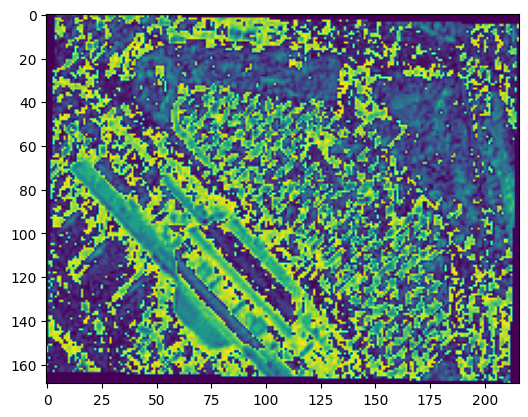

In [217]:
plt.imshow(sum_channels)

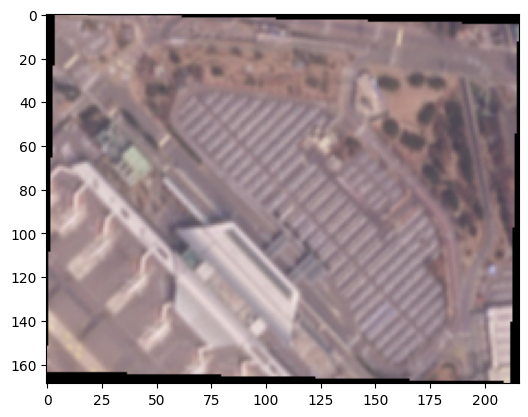

In [211]:
plt.imshow(out)

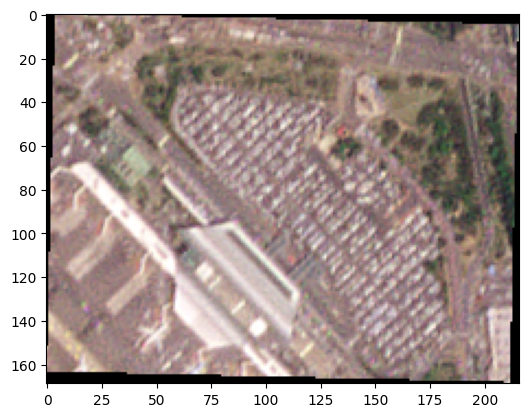

In [212]:
plt.imshow(img)